In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
import torch.nn.functional as F
import torchvision.utils as vutils
from torch.amp import GradScaler, autocast
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pandas as pd
import numpy as np
import os
import psutil
from sklearn.metrics import precision_score, recall_score

In [2]:
manualSeed = 999

In [ ]:
class MNISTDataset(Dataset):
    def __init__(self, root, train=True, transform=None, download=True):
        self.mnist_data = datasets.MNIST(root=root, train=train, transform=transform, download=download)

    def __len__(self):
        return len(self.mnist_data)

    def __getitem__(self, idx):
        image, label = self.mnist_data[idx]
        return image, label
    

class Generator(nn.Module):
    def __init__(self, noise_dim, img_dim):
        super(Generator, self).__init__()
        self.img_dim = img_dim
        self.fc = nn.Linear(noise_dim, 128 * 7 * 7)
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 1, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.fc(x)
        x = x.view(x.size(0), 128, 7, 7)
        x = self.deconv(x)
        return x
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Flatten(),
            nn.Linear(128 * 7 * 7, 1) 
        )

    def forward(self, x):
        return self.model(x)

class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(32 * 14 * 14, 128)
        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = x.view(-1, 32 * 14 * 14) 
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


In [4]:
logical_cores = os.cpu_count()
physical_cores = psutil.cpu_count(logical=False)
hyperthreading = logical_cores > physical_cores
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
gpu = torch.cuda.is_available()
print(f"Logical cores: {logical_cores}")
print(f"Physical cores: {physical_cores}")
print(f"Hyperthreading: {hyperthreading}")
print(f"Do we have a GPU: {gpu}")

transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.5,), (0.5,))])
train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.MNIST(root ='./data', train=False,download=True,transform=transform)
test_loader = DataLoader(dataset=test_dataset, batch_size=6,shuffle=False,num_workers=24)
classes = ('0','1','2','3','4','5','6','7','8','9')

Logical cores: 32
Physical cores: 24
Hyperthreading: True
Do we have a GPU: True


In [ ]:
num_epochs = 70
batch_size = 128
learning_rate = 0.0002
noise_dim = 100
img_dim = (1, 28, 28)
G_losses = []
D_losses = []
C_losses = 0.0
img_list = []
precision_list = []
recall_list = []
fixed_noise = torch.randn(32, noise_dim).to(device)
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=24)


classifer = Classifier().to(device)
generator = Generator(noise_dim,img_dim).to(device)
discriminator = Discriminator().to(device)

if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs")
    generator = nn.DataParallel(generator)
    discriminator = nn.DataParallel(discriminator)
    classifer = nn.DataParallel(classifer)

criterion = nn.BCEWithLogitsLoss()
criterion_classifer = nn.CrossEntropyLoss()
optimizer_c = optim.SGD(classifer.parameters(), lr = learning_rate, momentum=.9)
optimizer_g = optim.Adam(generator.parameters(), lr=learning_rate)
optimizer_d = optim.Adam(discriminator.parameters(), lr=learning_rate)

scaler = GradScaler()

for epoch in range(num_epochs):
    for i, (real_images, labels) in enumerate(train_loader):
        real_images = real_images.to(device)
        labels = labels.to(device)
        current_batch_size = real_images.size(0)
        real_labels = torch.ones(current_batch_size, 1, device=device, dtype=torch.float)
        fake_labels = torch.zeros(current_batch_size, 1, device=device, dtype=torch.float)

        optimizer_d.zero_grad()
        with autocast(device_type='cuda'):
            outputs = discriminator(real_images)
            d_loss_real = criterion(outputs, real_labels)
            noise = torch.randn(current_batch_size, noise_dim).to(device)
            fake_images = generator(noise)
            outputs = discriminator(fake_images.detach())
            d_loss_fake = criterion(outputs, fake_labels)
            d_loss = d_loss_real + d_loss_fake
        scaler.scale(d_loss).backward()
        scaler.step(optimizer_d)
        
        optimizer_g.zero_grad()
        with autocast(device_type='cuda'):
            noise = torch.randn(current_batch_size, noise_dim).to(device)
            fake_images = generator(noise)
            outputs = discriminator(fake_images)
            g_loss = criterion(outputs, real_labels)
        scaler.scale(g_loss).backward()
        scaler.step(optimizer_g)

        D_losses.append(d_loss.item())
        G_losses.append(g_loss.item())

        optimizer_c.zero_grad()
        with autocast(device_type='cuda'):
            outputs = classifer(real_images)
            c_loss = criterion_classifer(outputs, labels)
        scaler.scale(c_loss).backward()
        scaler.step(optimizer_c)

        scaler.update()

        C_losses +=c_loss.item()

        _,predicted = torch.max(outputs,1)
        precision = precision_score(labels.cpu(), predicted.cpu(), average='macro', zero_division=0)
        recall = recall_score(labels.cpu(), predicted.cpu(), average='macro',zero_division=0)
        precision_list.append(precision)
        recall_list.append(recall)

        if (i+1) % 100 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], 'f'D Loss: {d_loss.item():.3f}, G Loss: {g_loss.item():.3f}, C Loss: {C_losses / 100:.3f}, Precision: {precision:.3f}, Recall: {recall:.3f}')
            C_losses = 0.0
        if (i % 500) == 0:
            with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
    c_loss = 0.0

Epoch [1/70], Step [100/469], D Loss: 0.022, G Loss: 7.055, C Loss: 2.220, Precision: 0.615, Recall: 0.530
Epoch [1/70], Step [200/469], D Loss: 0.138, G Loss: 4.114, C Loss: 2.025, Precision: 0.750, Recall: 0.651
Epoch [1/70], Step [300/469], D Loss: 0.299, G Loss: 4.280, C Loss: 1.803, Precision: 0.801, Recall: 0.681
Epoch [1/70], Step [400/469], D Loss: 0.214, G Loss: 3.469, C Loss: 1.570, Precision: 0.836, Recall: 0.774
Epoch [2/70], Step [100/469], D Loss: 0.607, G Loss: 2.171, C Loss: 2.159, Precision: 0.799, Recall: 0.788
Epoch [2/70], Step [200/469], D Loss: 0.742, G Loss: 2.100, C Loss: 1.028, Precision: 0.815, Recall: 0.811
Epoch [2/70], Step [300/469], D Loss: 0.511, G Loss: 2.147, C Loss: 0.893, Precision: 0.830, Recall: 0.827
Epoch [2/70], Step [400/469], D Loss: 0.689, G Loss: 1.569, C Loss: 0.771, Precision: 0.837, Recall: 0.844
Epoch [3/70], Step [100/469], D Loss: 1.095, G Loss: 1.395, C Loss: 1.155, Precision: 0.853, Recall: 0.851
Epoch [3/70], Step [200/469], D Loss:

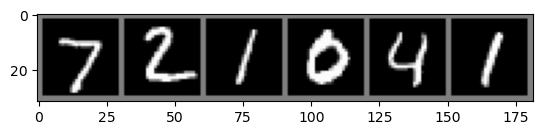

GroundTruth:  7     2     1     0     4     1    
Predicted:  7     2     1     0     4     1    


In [17]:
def imshow(img):
    img = img / 2 + 0.5
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

dataiter = iter(test_loader)
images, labels = next(dataiter)
images, labels = images.to(device), labels.to(device)
imshow(vutils.make_grid(images.cpu()))
print('GroundTruth: ',' '.join(f'{classes[labels[j]]:5s}' for j in range(len(labels))))

outputs = classifer(images)
_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join(f'{classes[predicted[j]]:5s}' for j in range(len(labels))))

In [8]:
correct = 0
total = 0

with torch.no_grad():
    for images,labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        
        outputs = classifer(images)
       
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the 10000 test images: {100 * correct // total} %')

Accuracy of the network on the 10000 test images: 97 %


In [9]:
correct_pred = {classname: 0 for classname in classes}
total_pred = {classname: 0 for classname in classes}


with torch.no_grad():
    for images,labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = classifer(images)
        _, predictions = torch.max(outputs, 1)
        
        for label, prediction in zip(labels, predictions):
            if label == prediction:
                correct_pred[classes[label]] += 1
            total_pred[classes[label]] += 1



for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    print(f'Accuracy for class: {classname:5s} is {accuracy:.1f} %')

Accuracy for class: 0     is 99.1 %
Accuracy for class: 1     is 99.1 %
Accuracy for class: 2     is 97.9 %
Accuracy for class: 3     is 98.8 %
Accuracy for class: 4     is 98.0 %
Accuracy for class: 5     is 97.2 %
Accuracy for class: 6     is 97.2 %
Accuracy for class: 7     is 96.1 %
Accuracy for class: 8     is 96.5 %
Accuracy for class: 9     is 95.8 %


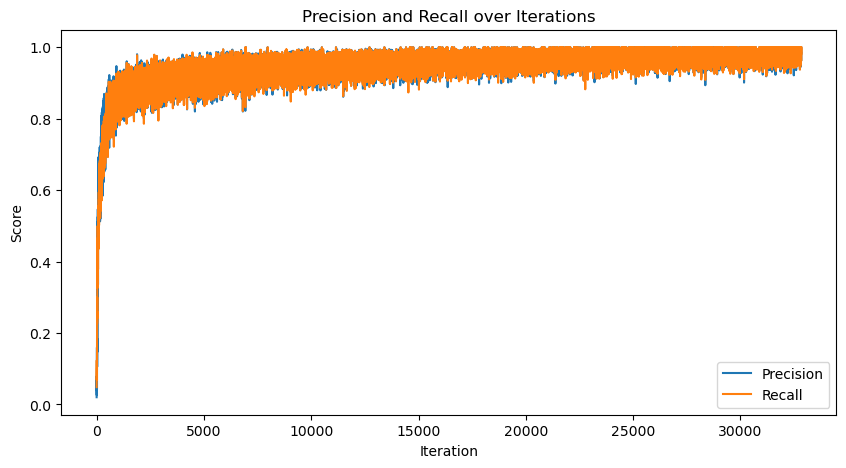

In [10]:
plt.figure(figsize=(10, 5))
plt.plot(precision_list, label='Precision')
plt.plot(recall_list, label='Recall')
plt.xlabel('Iteration')
plt.ylabel('Score')
plt.legend()
plt.title('Precision and Recall over Iterations')
plt.show()

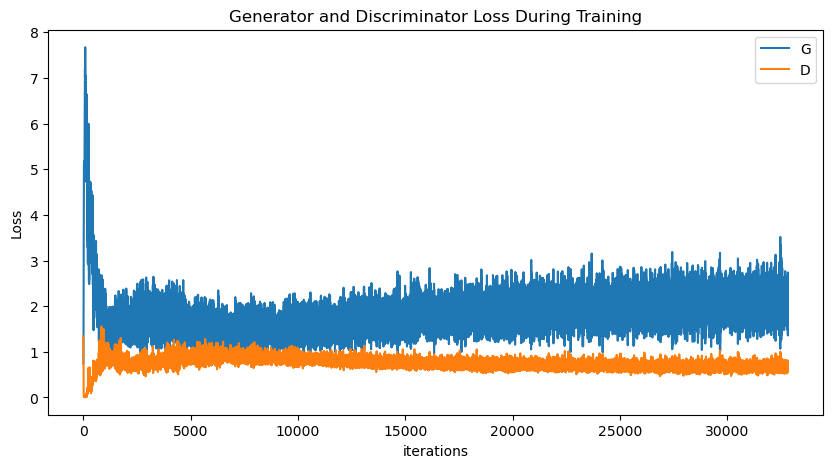

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

MovieWriter imagemagick unavailable; using Pillow instead.


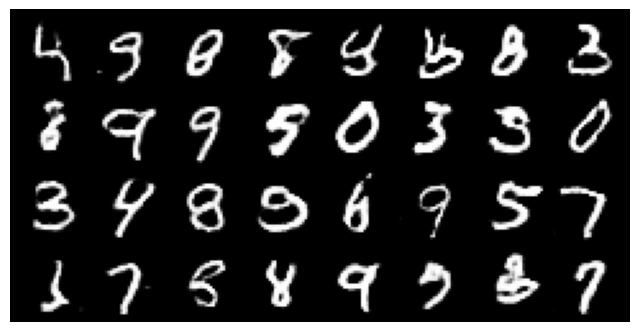

In [12]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
pictures_folder = os.path.join(os.path.expanduser('~'), 'Pictures', 'generated_images')
os.makedirs(pictures_folder, exist_ok=True)
ani.save(os.path.join(pictures_folder, 'animation.gif'), writer='imagemagick')
HTML(ani.to_jshtml())

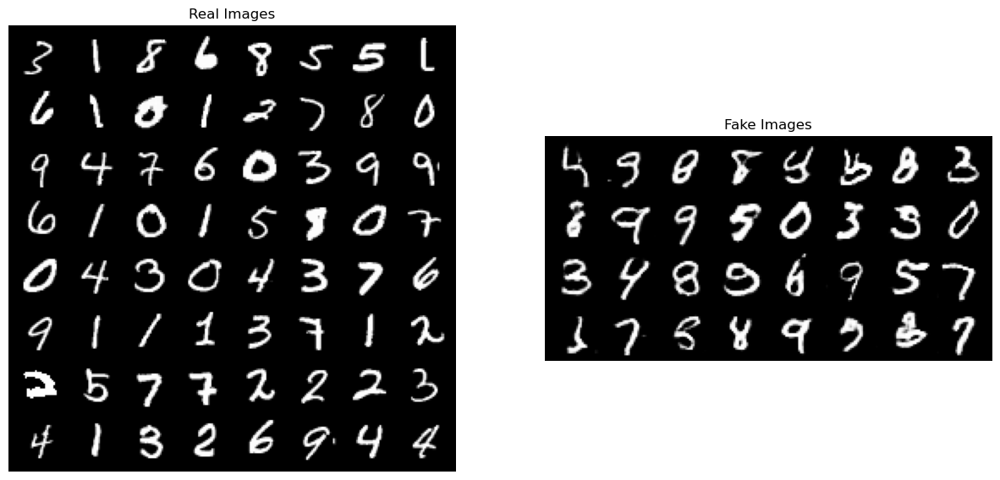

In [13]:
real_batch = next(iter(train_loader))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))


plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

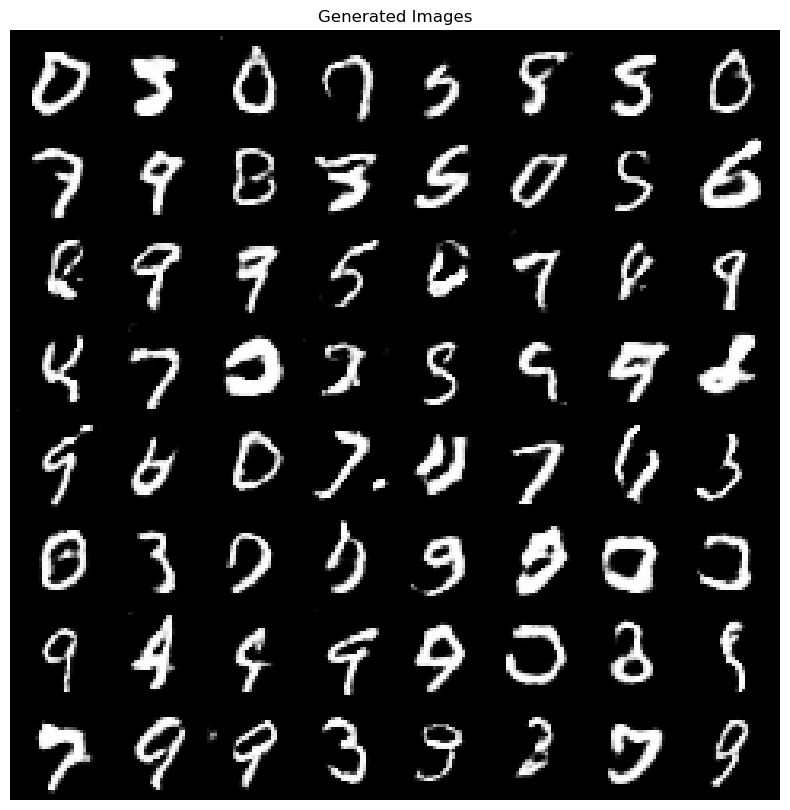

In [14]:
new_noise = torch.randn(64, noise_dim).to(device)
new_images = generator(new_noise).detach().cpu()
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(vutils.make_grid(new_images, padding=2, normalize=True),(1,2,0)))

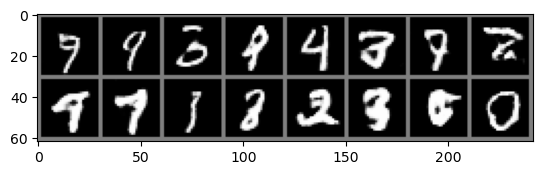

Predicted:  9     4     3     8     4     3     7     3     4     7     1     2     3     3     8     0    


In [16]:
test_noise = torch.randn(16,100,device=device)
test_images = generator(test_noise)
imshow(vutils.make_grid(test_images.cpu()))
outputs = classifer(test_images)
_,predicted = torch.max(outputs,1)
print('Predicted: ',' '.join(f'{classes[predicted[j]]:5s}' for j in range(len(predicted))))